In [1]:
## Tested using the following loaded modules
## module use /g/data/access/ngm/modules
## module load analysis3/21.10
import os, sys
workdir = "/g/data/xv83/users/bxn599/ACS/evaluation/"
os.chdir(workdir)
sys.path.append("./lib")
import glob
import xarray as xr
import numpy as np
import geopandas as gp
from datetime import datetime as dt
import lib_standards
import lib_spatial
import spatial_selection
import matplotlib as mpl
import matplotlib.pyplot as plt
import importlib
importlib.reload(lib_standards)
import warnings
warnings.filterwarnings('ignore')

font = {'size'   : 12}
mpl.rc('font', **font)

In [2]:
DATA_LOCATIONS = {
    'AGCD': "/g/data/ia39/australian-climate-service/test-data/CORDEX-CMIP6/indices/AUS-r005/none/BOM-AGCD/historical/none/none/none/climdex",
    'BARPA-R:ERA5': "/g/data/ia39/australian-climate-service/test-data/CORDEX-CMIP6/indices/AUS-15/BOM/ECMWF-ERA5/evaluation/none/BOM-BARPA-R/v1/climdex",
    'ERA5': "/g/data/ia39/australian-climate-service/test-data/CORDEX-CMIP6/indices/AUS-25/none/ECMWF-ERA5/historical/none/none/none/climdex",
    'CCAM:ERA5': "/g/data/ia39/australian-climate-service/test-data/CORDEX-CMIP6/indices/AUS-10/CSIRO/ECMWF-ERA5/evaluation/none/CSIRO-CCAM-2203/v1/climdex",
}
# Frequency of icclim indicator
FREQ = 'month'
# Data sources to consider here
SOURCES = ['BARPA-R:ERA5', 'CCAM:ERA5', 'AGCD', 'ERA5']
# Grid to used as the reference grid to compute difference metrics
REFERENCE_GRID = 'AGCD'
# "Truth" for compute difference metrics
REFERENCE = 'AGCD'
# Region of interest, as per defined in lib_standards.DOMAINS
REGION = 'Australia'  
# Period of interest, as per defined in lib_standards.PERIODS
PERIOD = 'HISTORICAL_WHOLE' 
SEASON='all'

In [3]:
def prepare_data(index, sources=SOURCES, freq=FREQ, region=REGION, period=PERIOD, reference_grid=REFERENCE_GRID, season=SEASON):
    """
    Reads in the icclim data and regrid to the reference grid.
    """
    # Load the data sources
    ds = {}
    for s in sources:
        #print("Reading the data {:}".format(s))
        fs = glob.glob(os.path.join(DATA_LOCATIONS[s], index, "{index}_*_{freq}_*.nc".format(index=index, freq=freq)))
        ds[s] = xr.open_dataset(fs[0])
        ds[s] = lib_standards.standardise_data(ds[s], region=region, period=period, season=season, compute=True)

    # Regrid to the REFERENCE_GRID
    ds_regrid = {}
    for s in sources:
        #print("Regridding the data {:} to reference grid of {:}".format(s, reference_grid))
        #ds_regrid[s] = lib_spatial.add_region_land_mask(ds[s], region)
        ds_regrid[s] = ds[s]
        if s == reference_grid:
            ds_regrid[s] = ds_regrid[s].compute()
        else:
            ds_regrid[s] = lib_standards.regrid(ds_regrid[s], ds[reference_grid]).compute()
    return ds_regrid

# PRCPTOT: Total precipitation during Wet Days

index = PRCPTOT
False
index = PRCPTOT:DJF
False
index = PRCPTOT:MAM
False
index = PRCPTOT:JJA
False
index = PRCPTOT:SON
False


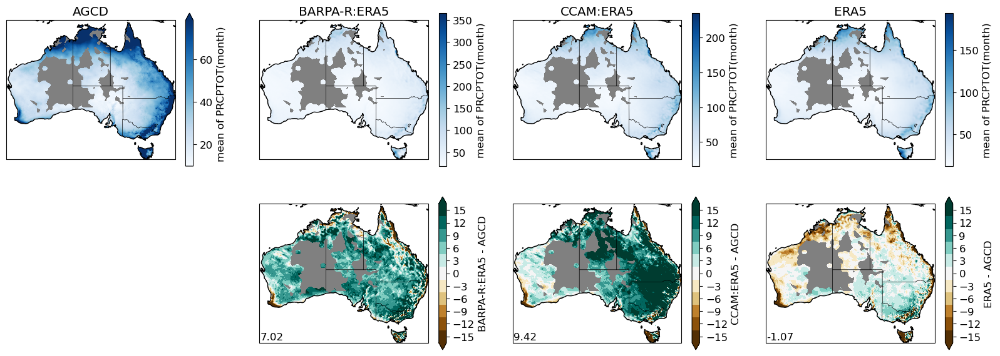

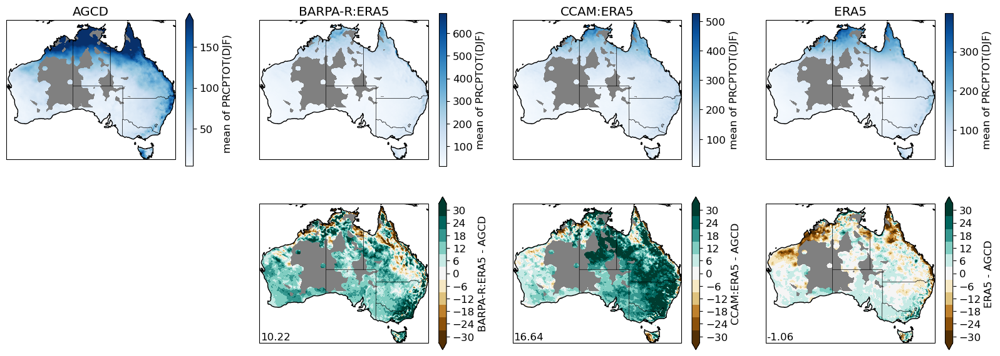

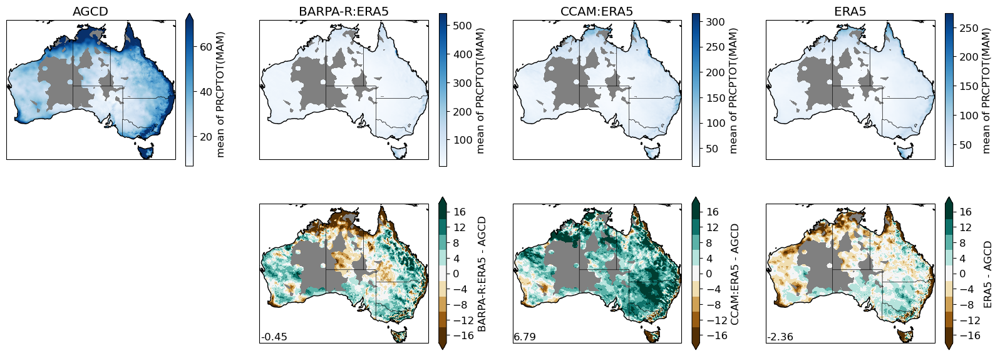

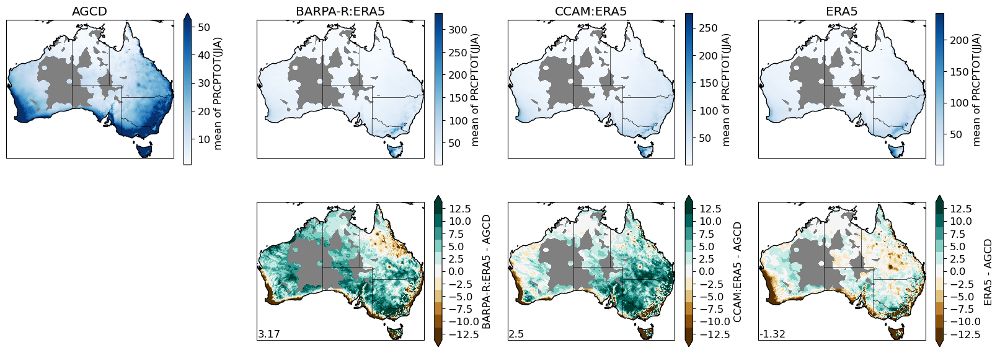

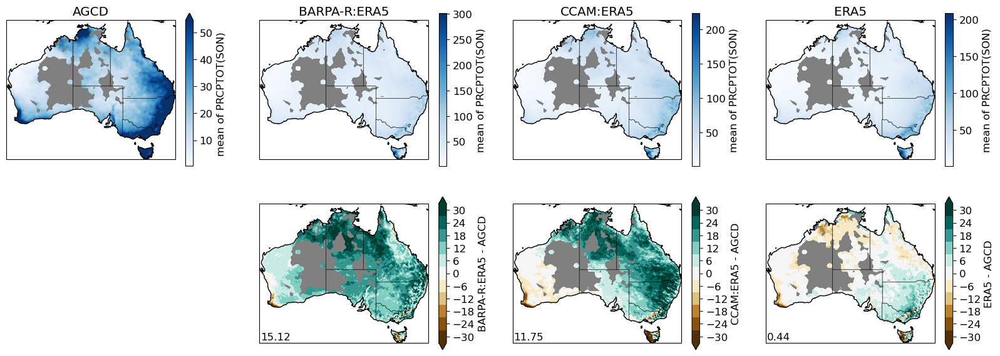

In [4]:
INDEXES = ['PRCPTOT', 'PRCPTOT:DJF', 'PRCPTOT:MAM', 'PRCPTOT:JJA', 'PRCPTOT:SON']
for index in INDEXES:
    print("index = {:}".format(index))
    
    # check whether the index has special conditions
    index_condition = None
    if not ":" in index:
        # Prepare all the icclim data as per the setup in CONFIGURATIONS
        ds = prepare_data(index)
        clabel = "mean of {index}({freq})".format(index=index, freq=FREQ)
    else:
        index_condition = index.split(":")[1]
        index = index.split(":")[0]
        ds = prepare_data(index, season=index_condition)
        clabel = "mean of {index}({index_condition})".format(index=index, index_condition=index_condition)
    
    ds_target = {}
    for s in SOURCES:
        ds_target[s] = ds[s][index].mean(dim='time')
        ds_target[s] = lib_spatial.apply_region_mask(ds_target[s], 'Australia')
        if 'PRCPTOT' in index:
            ds_target[s] = lib_spatial.apply_agcd_data_mask(ds_target[s])

    if index in ["PRCPTOT"]:
        cmap_variable = 'precip'
        cmap_class = 'wet'
    
    lib_standards.spatial_plot(ds_target, reference=REFERENCE, 
                               cmap_variable=cmap_variable, cmap_class=cmap_class, 
                               clabel=clabel, plot_difference=True,
                               include_all_data=True, include_diff_avg=True)

# RR: Precipitation sum (mm)

index = RR
False
index = RR:DJF
False
index = RR:MAM
False
index = RR:JJA
False
index = RR:SON
False


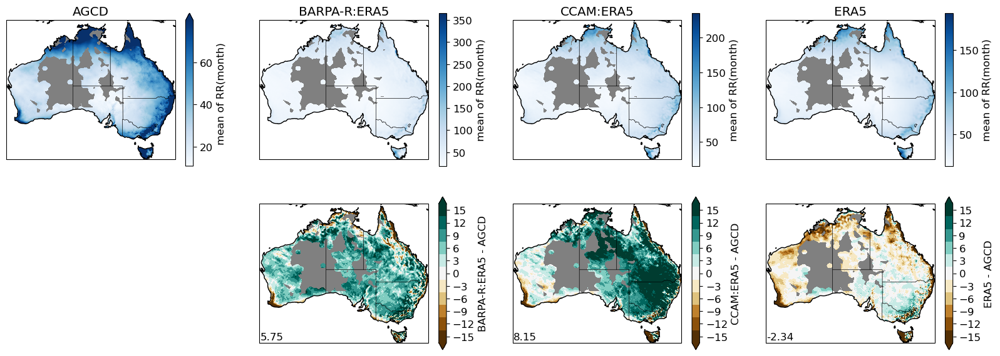

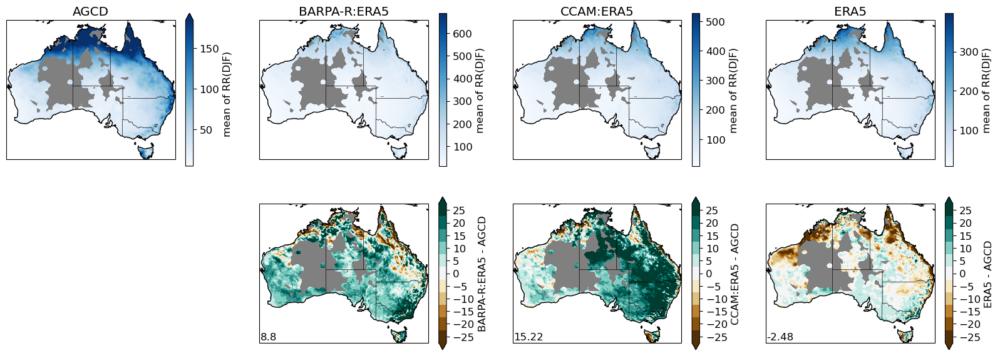

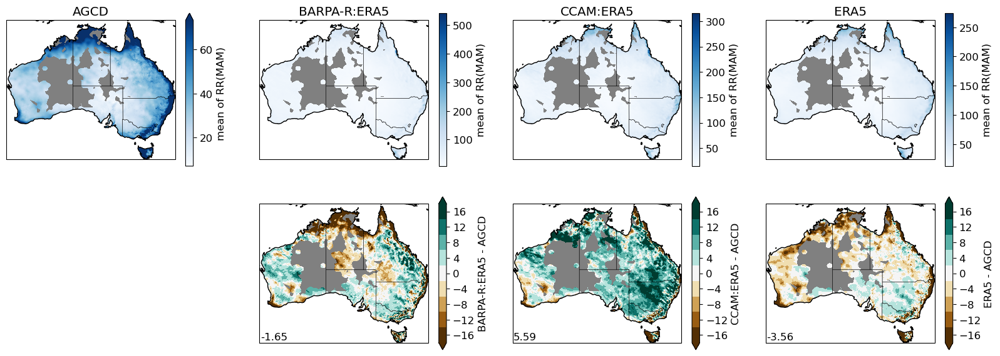

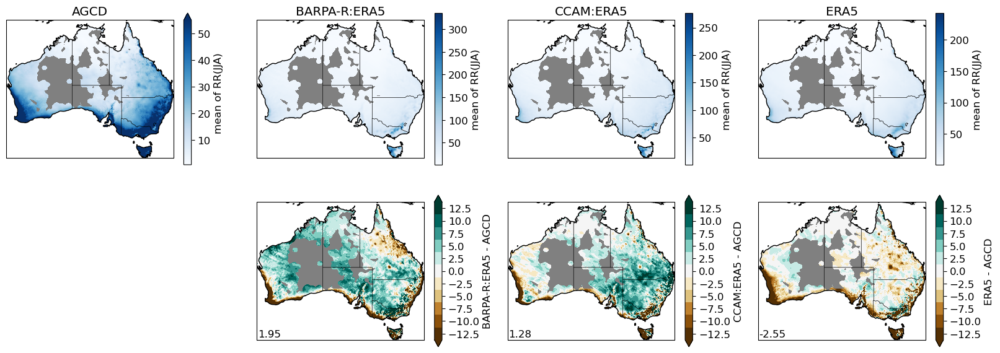

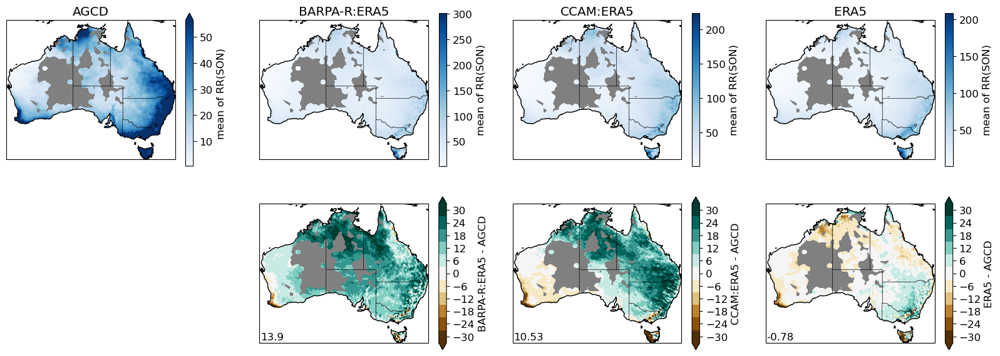

In [5]:
INDEXES = ['RR', 'RR:DJF', 'RR:MAM', 'RR:JJA', 'RR:SON']
for index in INDEXES:
    print("index = {:}".format(index))
    
    # check whether the index has special conditions
    index_condition = None
    if not ":" in index:
        # Prepare all the icclim data as per the setup in CONFIGURATIONS
        ds = prepare_data(index)
        clabel = "mean of {index}({freq})".format(index=index, freq=FREQ)
    else:
        index_condition = index.split(":")[1]
        index = index.split(":")[0]
        ds = prepare_data(index, season=index_condition)
        clabel = "mean of {index}({index_condition})".format(index=index, index_condition=index_condition)
    
    ds_target = {}
    for s in SOURCES:
        ds_target[s] = ds[s][index].mean(dim='time')
        ds_target[s] = lib_spatial.apply_region_mask(ds_target[s], 'Australia')
        if 'RR' in index:
            ds_target[s] = lib_spatial.apply_agcd_data_mask(ds_target[s])

    if index in ["RR"]:
        cmap_variable = 'precip'
        cmap_class = 'wet'
    
    lib_standards.spatial_plot(ds_target, reference=REFERENCE, 
                               cmap_variable=cmap_variable, cmap_class=cmap_class, 
                               clabel=clabel, plot_difference=True,
                               include_all_data=True, include_diff_avg=True)

# RX5day: Maximum 5-day total precipitation 

index = RX5day
False
index = RX5day:DJF
False
index = RX5day:MAM
False
index = RX5day:JJA
False
index = RX5day:SON
False


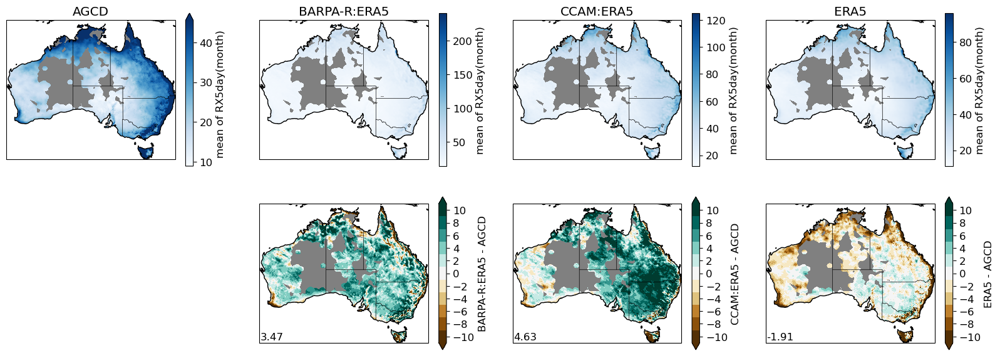

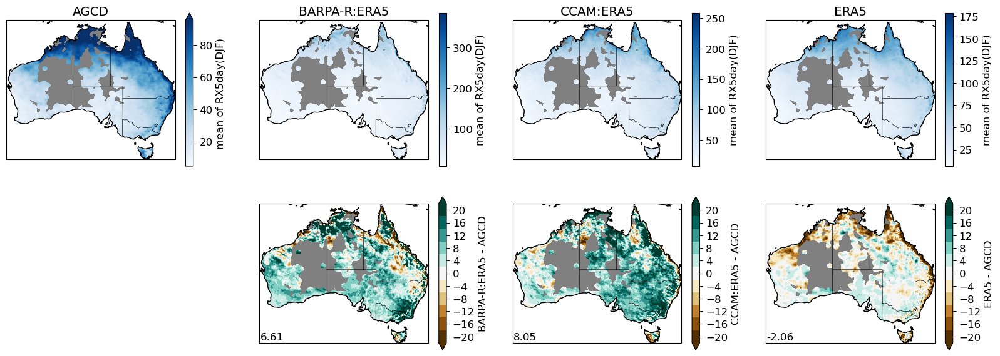

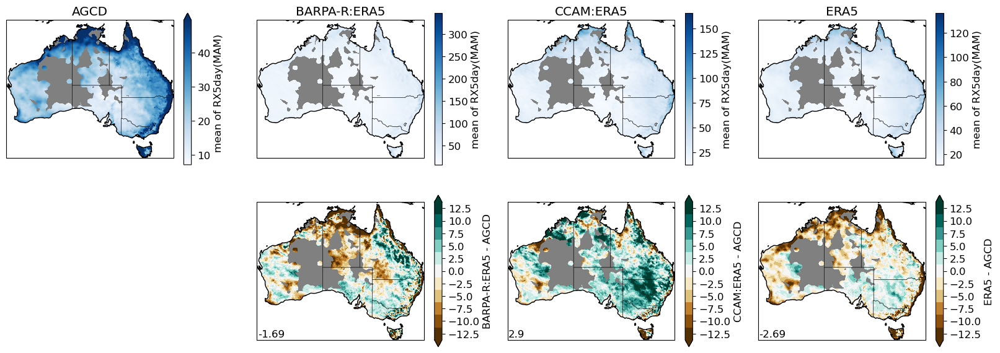

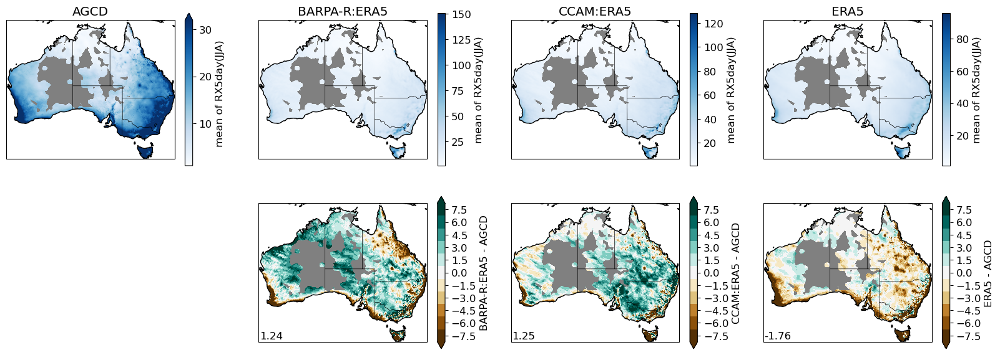

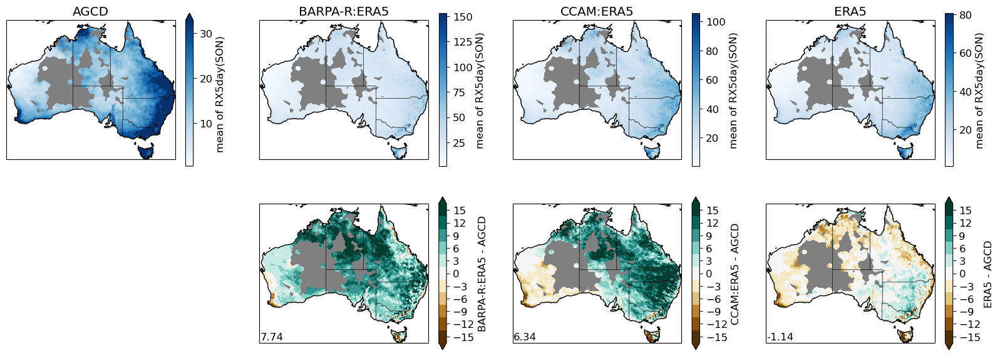

In [6]:
INDEXES = ['RX5day', 'RX5day:DJF', 'RX5day:MAM', 'RX5day:JJA', 'RX5day:SON']
for index in INDEXES:
    print("index = {:}".format(index))
    
    # check whether the index has special conditions
    index_condition = None
    if not ":" in index:
        # Prepare all the icclim data as per the setup in CONFIGURATIONS
        ds = prepare_data(index)
        clabel = "mean of {index}({freq})".format(index=index, freq=FREQ)
    else:
        index_condition = index.split(":")[1]
        index = index.split(":")[0]
        ds = prepare_data(index, season=index_condition)
        clabel = "mean of {index}({index_condition})".format(index=index, index_condition=index_condition)
    
    ds_target = {}
    for s in SOURCES:
        ds_target[s] = ds[s][index].mean(dim='time')
        ds_target[s] = lib_spatial.apply_region_mask(ds_target[s], 'Australia')
        if 'RX5day' in index:
            ds_target[s] = lib_spatial.apply_agcd_data_mask(ds_target[s])

    if index in ["RX5day"]:
        cmap_variable = 'precip'
        cmap_class = 'wet'
    
    lib_standards.spatial_plot(ds_target, reference=REFERENCE, 
                               cmap_variable=cmap_variable, cmap_class=cmap_class, 
                               clabel=clabel, plot_difference=True,
                               include_all_data=True, include_diff_avg=True)

# R99p: Days with RR > 99th percentile of daily amounts (extremely wet days)

index = R99p
False
index = R99p:DJF
False
index = R99p:MAM
False
index = R99p:JJA
False
index = R99p:SON
False


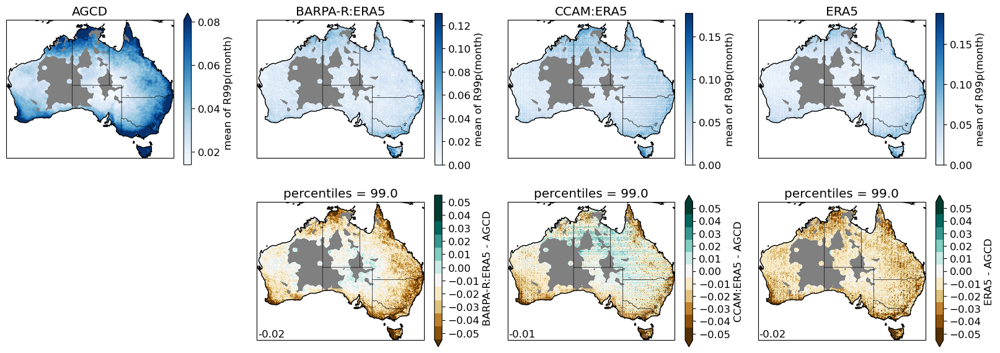

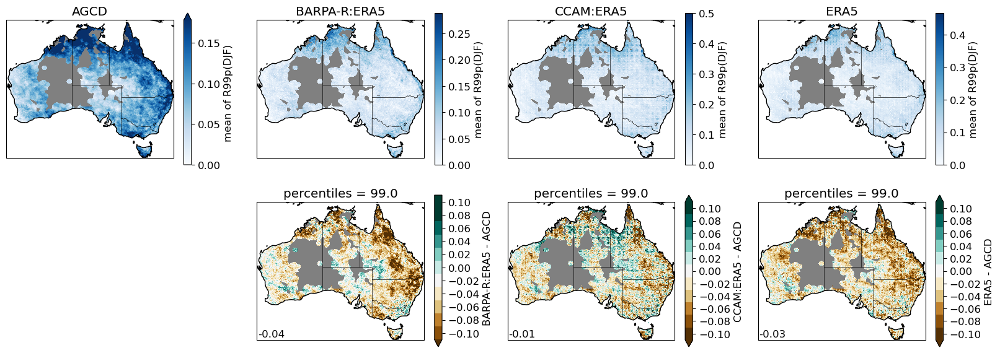

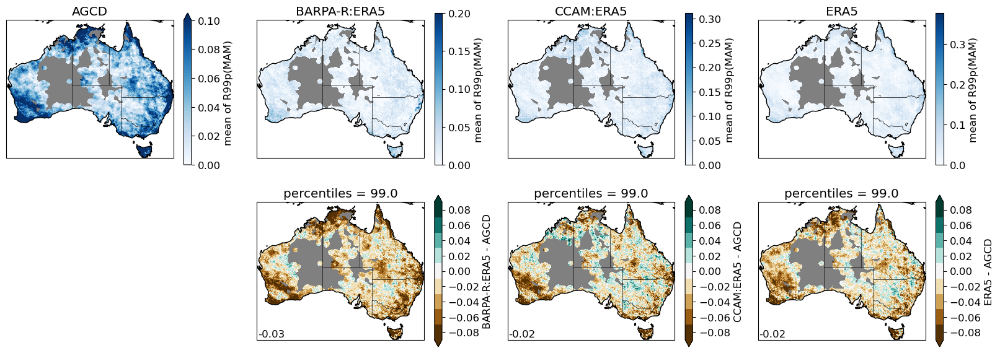

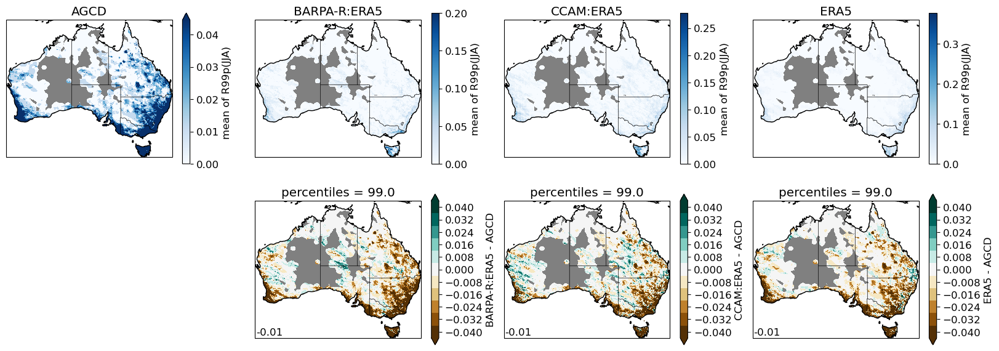

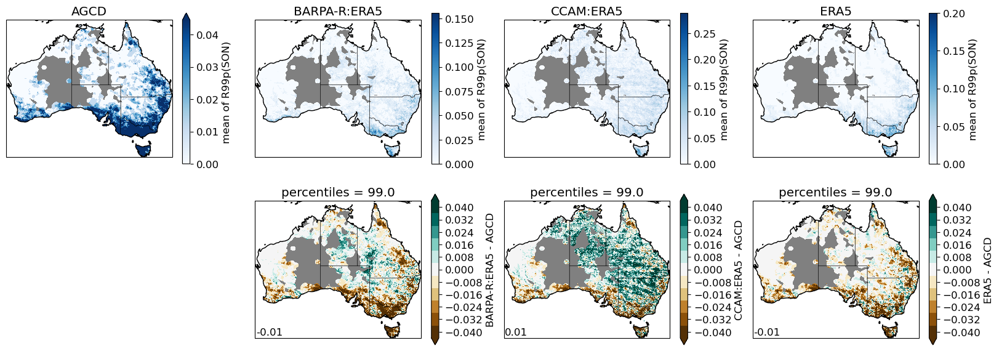

In [7]:
INDEXES = ['R99p', 'R99p:DJF', 'R99p:MAM', 'R99p:JJA', 'R99p:SON']
for index in INDEXES:
    print("index = {:}".format(index))
    
    # check whether the index has special conditions
    index_condition = None
    if not ":" in index:
        # Prepare all the icclim data as per the setup in CONFIGURATIONS
        ds = prepare_data(index)
        clabel = "mean of {index}({freq})".format(index=index, freq=FREQ)
    else:
        index_condition = index.split(":")[1]
        index = index.split(":")[0]
        ds = prepare_data(index, season=index_condition)
        clabel = "mean of {index}({index_condition})".format(index=index, index_condition=index_condition)
    
    ds_target = {}
    for s in SOURCES:
        ds_target[s] = ds[s][index].mean(dim='time')
        ds_target[s] = lib_spatial.apply_region_mask(ds_target[s], 'Australia')
        if 'R99p' in index:
            ds_target[s] = lib_spatial.apply_agcd_data_mask(ds_target[s])

    if index in ["R99p"]:
        cmap_variable = 'precip'
        cmap_class = 'wet'
    
    lib_standards.spatial_plot(ds_target, reference=REFERENCE, 
                               cmap_variable=cmap_variable, cmap_class=cmap_class, 
                               clabel=clabel, plot_difference=True,
                               include_all_data=True, include_diff_avg=True)

# R20mm: Number of very heavy precipitation days (Precip >= 20mm)

index = R20mm
False
index = R20mm:DJF
False
index = R20mm:MAM
False
index = R20mm:JJA
False
index = R20mm:SON
False


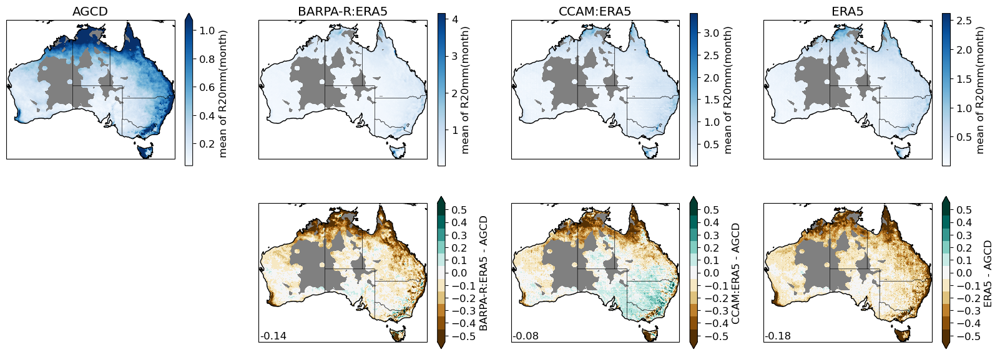

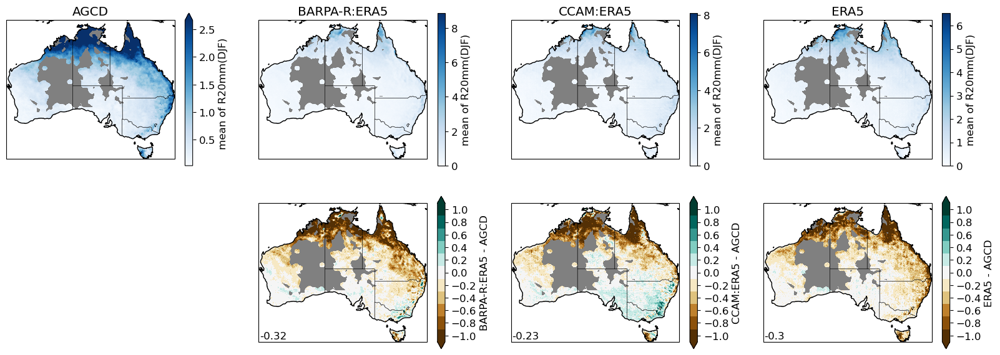

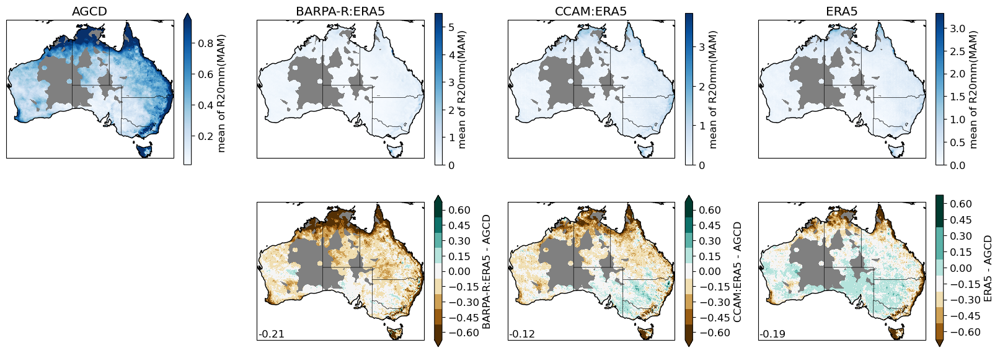

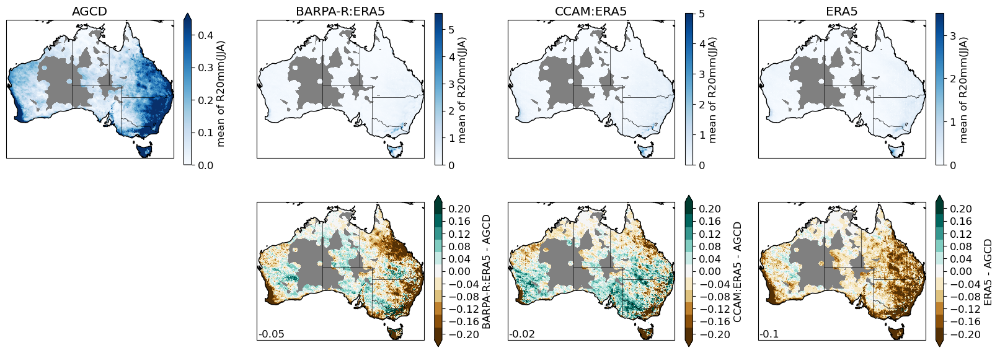

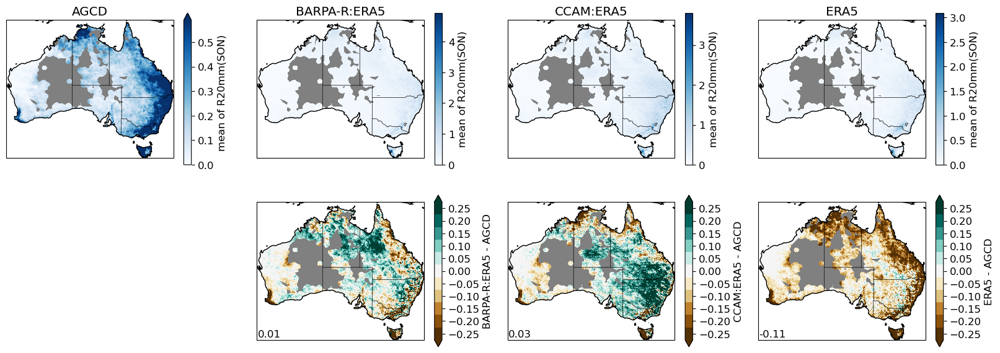

In [8]:
INDEXES = ['R20mm', 'R20mm:DJF', 'R20mm:MAM', 'R20mm:JJA', 'R20mm:SON']
for index in INDEXES:
    print("index = {:}".format(index))
    
    # check whether the index has special conditions
    index_condition = None
    if not ":" in index:
        # Prepare all the icclim data as per the setup in CONFIGURATIONS
        ds = prepare_data(index)
        clabel = "mean of {index}({freq})".format(index=index, freq=FREQ)
    else:
        index_condition = index.split(":")[1]
        index = index.split(":")[0]
        ds = prepare_data(index, season=index_condition)
        clabel = "mean of {index}({index_condition})".format(index=index, index_condition=index_condition)
    
    ds_target = {}
    for s in SOURCES:
        ds_target[s] = ds[s][index].mean(dim='time')
        ds_target[s] = lib_spatial.apply_region_mask(ds_target[s], 'Australia')
        if 'R20mm' in index:
            ds_target[s] = lib_spatial.apply_agcd_data_mask(ds_target[s])

    if index in ["R20mm"]:
        cmap_variable = 'precip'
        cmap_class = 'wet'
    
    lib_standards.spatial_plot(ds_target, reference=REFERENCE, 
                               cmap_variable=cmap_variable, cmap_class=cmap_class, 
                               clabel=clabel, plot_difference=True,
                               include_all_data=True, include_diff_avg=True)

# CDD: Maximum consecutive dry days (Precip < 1mm)

index = CDD
False
index = CDD:DJF
False
index = CDD:MAM
False
index = CDD:JJA
False
index = CDD:SON
False


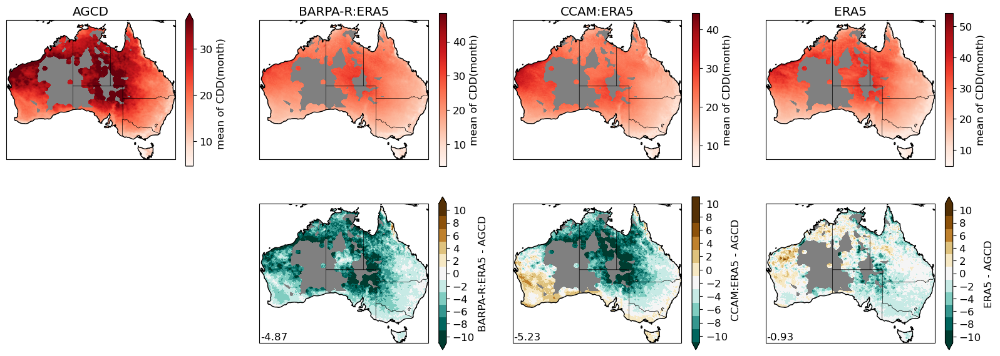

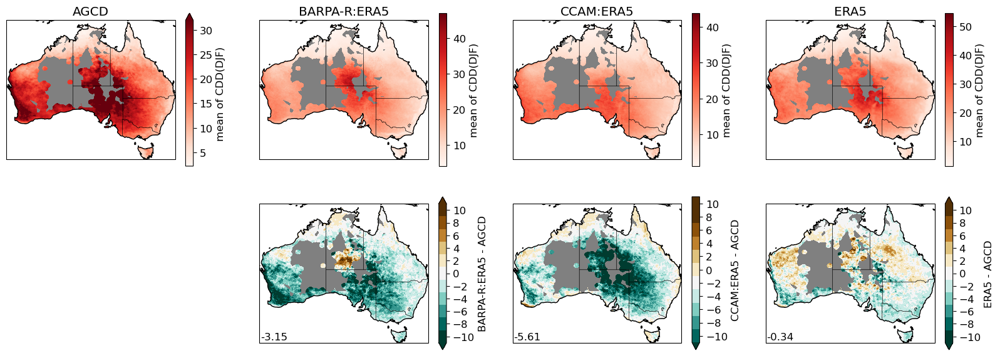

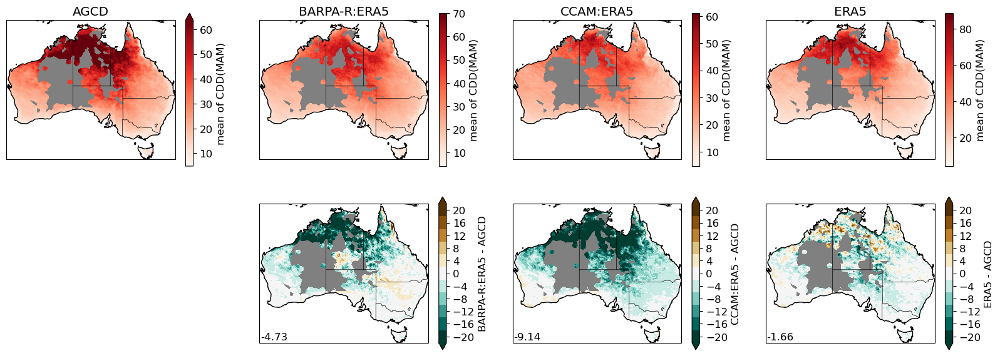

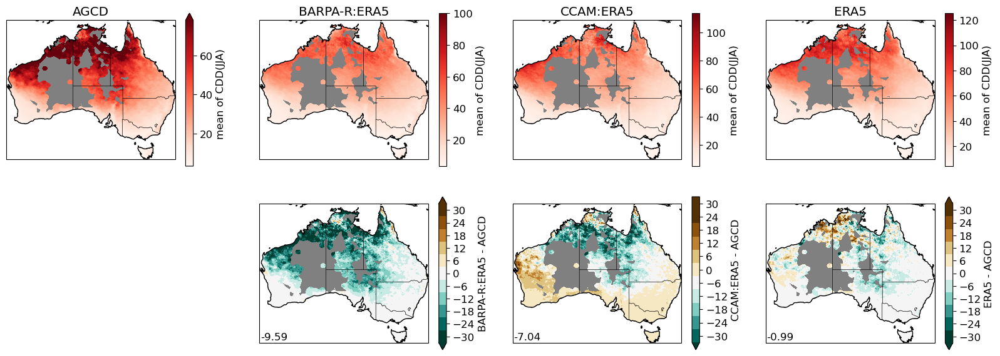

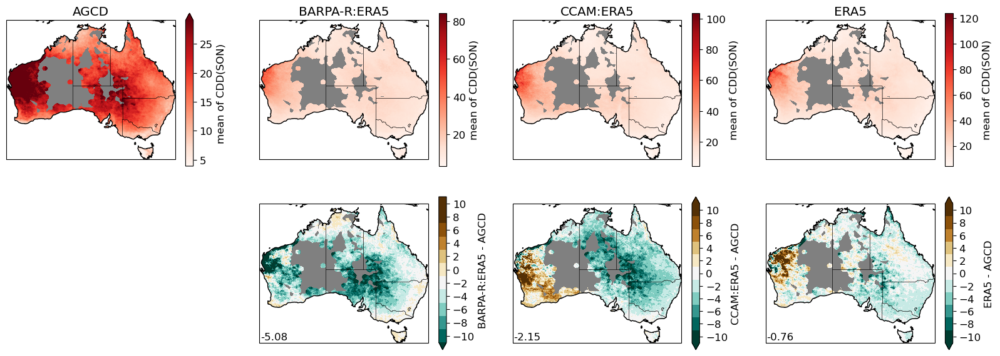

In [9]:
INDEXES = ['CDD', 'CDD:DJF', 'CDD:MAM', 'CDD:JJA', 'CDD:SON']
for index in INDEXES:
    print("index = {:}".format(index))
    
    # check whether the index has special conditions
    index_condition = None
    if not ":" in index:
        # Prepare all the icclim data as per the setup in CONFIGURATIONS
        ds = prepare_data(index)
        clabel = "mean of {index}({freq})".format(index=index, freq=FREQ)
    else:
        index_condition = index.split(":")[1]
        index = index.split(":")[0]
        ds = prepare_data(index, season=index_condition)
        clabel = "mean of {index}({index_condition})".format(index=index, index_condition=index_condition)
    
    ds_target = {}
    for s in SOURCES:
        ds_target[s] = ds[s][index].mean(dim='time')
        ds_target[s] = lib_spatial.apply_region_mask(ds_target[s], 'Australia')
        if 'CDD' in index:
            ds_target[s] = lib_spatial.apply_agcd_data_mask(ds_target[s])

    if index in ["CDD"]:
        cmap_variable = 'precip'
        cmap_class = 'dry'
    
    lib_standards.spatial_plot(ds_target, reference=REFERENCE, 
                               cmap_variable=cmap_variable, cmap_class=cmap_class, 
                               clabel=clabel, plot_difference=True,
                               include_all_data=True, include_diff_avg=True)

# CWD: Maximum consecutive wet days (Precip >= 1mm)

index = CWD
False
index = CWD:DJF
False
index = CWD:MAM
False
index = CWD:JJA
False
index = CWD:SON
False


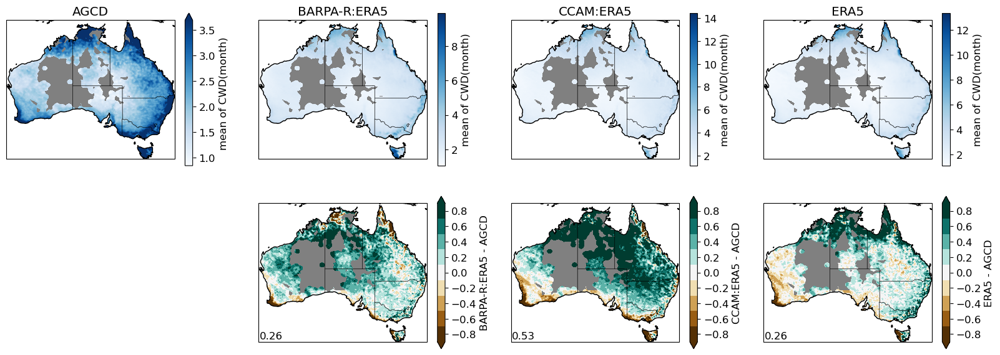

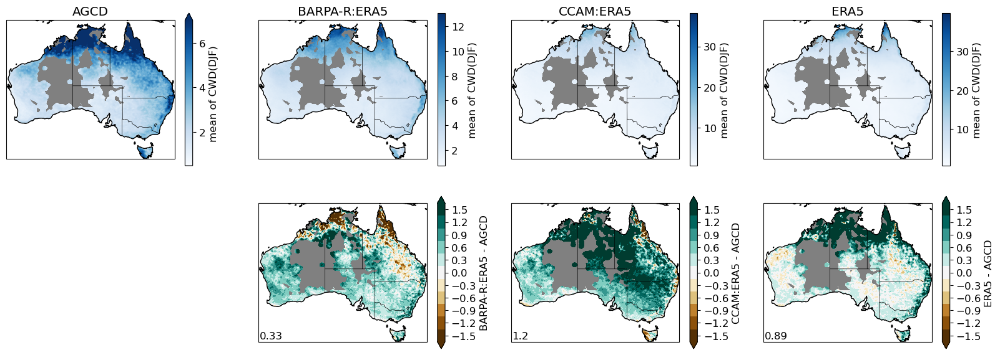

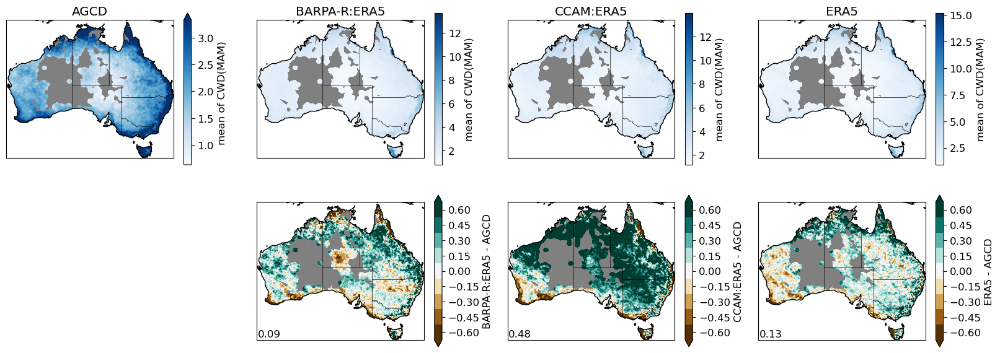

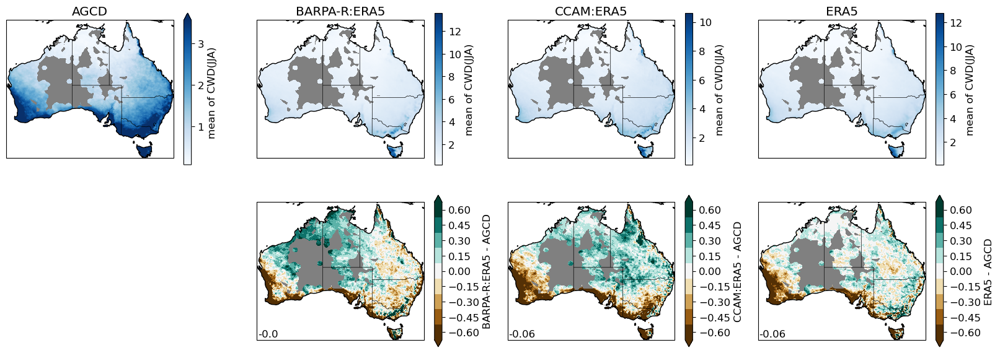

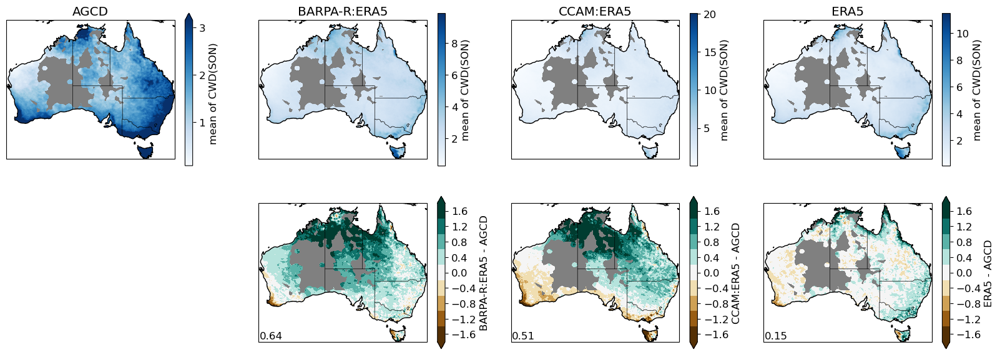

In [10]:
INDEXES = ['CWD', 'CWD:DJF', 'CWD:MAM', 'CWD:JJA', 'CWD:SON']
for index in INDEXES:
    print("index = {:}".format(index))
    
    # check whether the index has special conditions
    index_condition = None
    if not ":" in index:
        # Prepare all the icclim data as per the setup in CONFIGURATIONS
        ds = prepare_data(index)
        clabel = "mean of {index}({freq})".format(index=index, freq=FREQ)
    else:
        index_condition = index.split(":")[1]
        index = index.split(":")[0]
        ds = prepare_data(index, season=index_condition)
        clabel = "mean of {index}({index_condition})".format(index=index, index_condition=index_condition)
    
    ds_target = {}
    for s in SOURCES:
        ds_target[s] = ds[s][index].mean(dim='time')
        ds_target[s] = lib_spatial.apply_region_mask(ds_target[s], 'Australia')
        if 'CWD' in index:
            ds_target[s] = lib_spatial.apply_agcd_data_mask(ds_target[s])

    if index in ["CWD"]:
        cmap_variable = 'precip'
        cmap_class = 'wet'
    
    lib_standards.spatial_plot(ds_target, reference=REFERENCE, 
                               cmap_variable=cmap_variable, cmap_class=cmap_class, 
                               clabel=clabel, plot_difference=True,
                               include_all_data=True, include_diff_avg=True)

# SDII: Average precipitation during Wet Days (SDII) 

index = SDII
False
index = SDII:DJF
False
index = SDII:MAM
False
index = SDII:JJA
False
index = SDII:SON
False


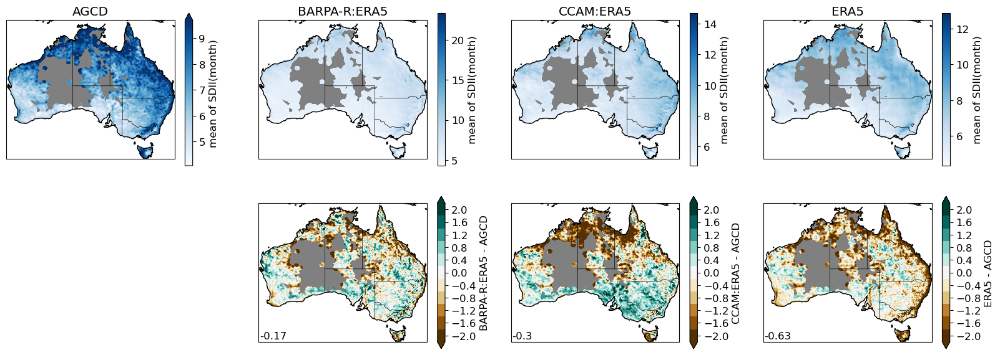

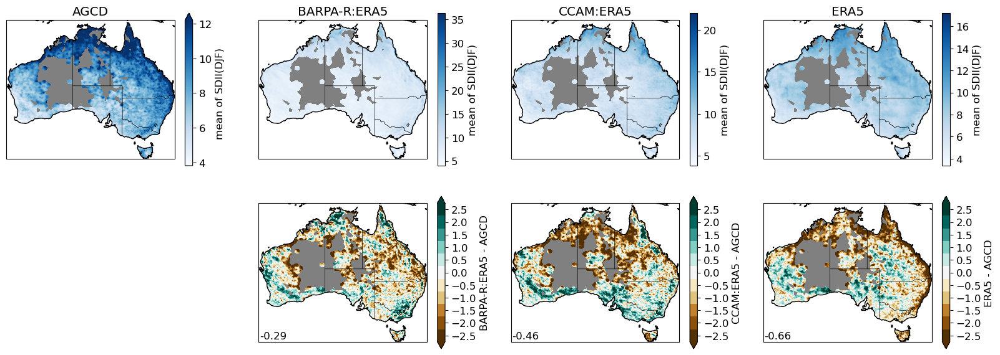

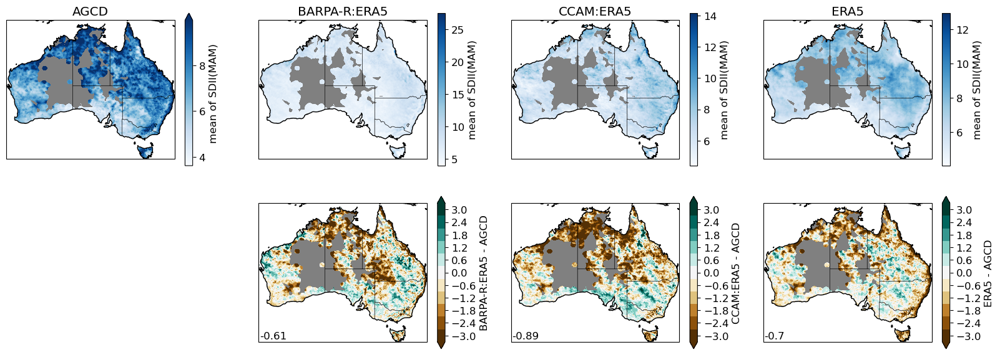

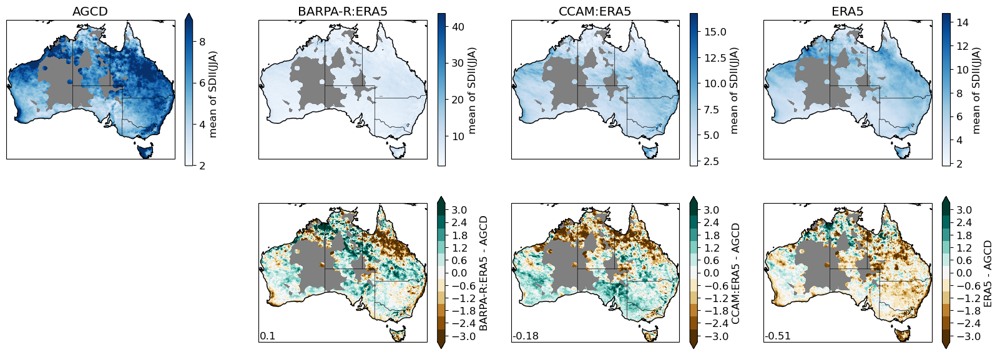

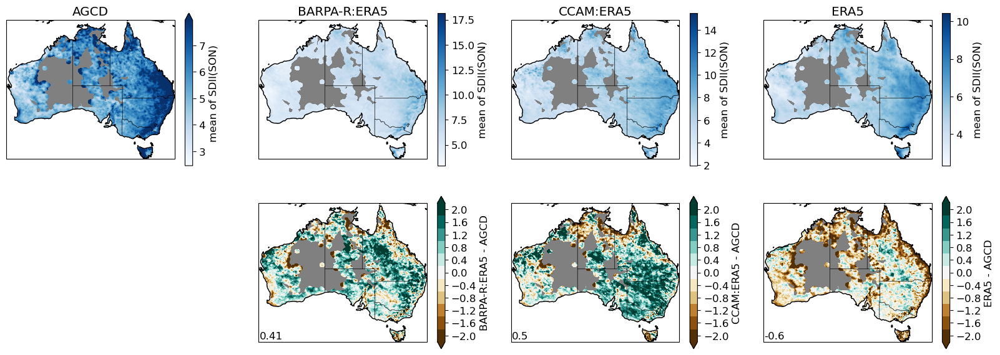

In [11]:
INDEXES = ['SDII', 'SDII:DJF', 'SDII:MAM', 'SDII:JJA', 'SDII:SON']
for index in INDEXES:
    print("index = {:}".format(index))
    
    # check whether the index has special conditions
    index_condition = None
    if not ":" in index:
        # Prepare all the icclim data as per the setup in CONFIGURATIONS
        ds = prepare_data(index)
        clabel = "mean of {index}({freq})".format(index=index, freq=FREQ)
    else:
        index_condition = index.split(":")[1]
        index = index.split(":")[0]
        ds = prepare_data(index, season=index_condition)
        clabel = "mean of {index}({index_condition})".format(index=index, index_condition=index_condition)
    
    ds_target = {}
    for s in SOURCES:
        ds_target[s] = ds[s][index].mean(dim='time')
        ds_target[s] = lib_spatial.apply_region_mask(ds_target[s], 'Australia')
        if 'SDII' in index:
            ds_target[s] = lib_spatial.apply_agcd_data_mask(ds_target[s])

    if index in ["SDII"]:
        cmap_variable = 'precip'
        cmap_class = 'wet'
    
    lib_standards.spatial_plot(ds_target, reference=REFERENCE, 
                               cmap_variable=cmap_variable, cmap_class=cmap_class, 
                               clabel=clabel, plot_difference=True,
                               include_all_data=True, include_diff_avg=True)